<a href="https://colab.research.google.com/github/MattiaCastelmare/Vision-and-Perception/blob/main/Training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Cose da fare:

- finire il fine tuning (DA FINIRE)
- mettere il tempo di ogni epoca nel training (DA FARE)
- importare e fare il test sul nuovo test set (DA FARE)


- aggiunta di unpossibile transformer (MAH)


!!!
Occhio perchè ho commentato nella parte di caricamento del drive il mio path al posto del tuo, commenta il mio e uncommenta il tuo ;)

Ho abbassato il dropout nei conv layer da 0.5 a 0.3,

Poi ho provato ad inserire sia la tqdm (progression bar) sia il tempo di esecuzione come differenza di tempo (time.time() - initial_time)


##Importing libraries

In [ ]:
import os
import sys
import torchvision
from torchvision import datasets, transforms
import torch
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
import time
import gc
torch.manual_seed(2)

In [ ]:
!pip install pytorch-msssim
from pytorch_msssim import ssim, SSIM

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


##Mounting the drive, unzip and download the dataset and the test set

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
annotation_folder = '/content/Dataset'
if not os.path.exists(os.path.abspath(".") + annotation_folder):
  !unzip '/content/drive/MyDrive/Colab Notebooks/Copia di nyu_data.zip' -d '/content/Dataset'  #Mattia Path
  #!unzip '/content/drive/MyDrive/Copia di nyu_data.zip' -d '/content/Dataset'                   #Diego Path
#%rm -rf '/content/Dataset/data/nyu2_test'
%rm -rf '/content/sample_data'

Output streaming troncato alle ultime 5000 righe.
 extracting: /content/Dataset/data/nyu2_train/playroom_0004_out/39.png  
  inflating: /content/Dataset/data/nyu2_train/playroom_0004_out/4.jpg  
 extracting: /content/Dataset/data/nyu2_train/playroom_0004_out/4.png  
  inflating: /content/Dataset/data/nyu2_train/playroom_0004_out/40.jpg  
 extracting: /content/Dataset/data/nyu2_train/playroom_0004_out/40.png  
  inflating: /content/Dataset/data/nyu2_train/playroom_0004_out/41.jpg  
 extracting: /content/Dataset/data/nyu2_train/playroom_0004_out/41.png  
  inflating: /content/Dataset/data/nyu2_train/playroom_0004_out/42.jpg  
 extracting: /content/Dataset/data/nyu2_train/playroom_0004_out/42.png  
  inflating: /content/Dataset/data/nyu2_train/playroom_0004_out/43.jpg  
 extracting: /content/Dataset/data/nyu2_train/playroom_0004_out/43.png  
  inflating: /content/Dataset/data/nyu2_train/playroom_0004_out/44.jpg  
 extracting: /content/Dataset/data/nyu2_train/playroom_0004_out/44.png  
  i

##Preparing the dataset
Dividing it into training and validation set

In [ ]:
path = '/content/Dataset/data/nyu2_train'
train_file = []
for root, dirs, files in os.walk(path):
  for file in files:
    train_file.append(os.path.join(root, file))
train_file.sort()
data = {
    "image": [x for x in train_file if x.endswith(".jpg")],
    "depth": [x for x in train_file if x.endswith(".png")],
    }

train = pd.DataFrame(data)
training_data = train.sample(frac = 0.8, random_state = 5).reset_index(drop = True)
validation_data = train.drop(training_data.index).reset_index(drop = True)

print(f"Number of examples for training: {training_data.shape[0]}")
print(f"Number of examples for validation: {validation_data.shape[0]}")

Height = cv2.imread(training_data['image'][0]).shape[0]
Width = cv2.imread(training_data['image'][0]).shape[1]
Channel = cv2.imread(training_data['image'][0]).shape[2]

Height_depth = cv2.imread(training_data['depth'][0], cv2.IMREAD_GRAYSCALE).shape[0]
Width_depth = cv2.imread(training_data['depth'][0], cv2.IMREAD_GRAYSCALE).shape[1]
Channel_depth = 1

print(f'The dimensions of the RGB images are: height: {Height}, width: {Width} and channels: {Channel}')
print(f'The dimensions of the depth images are: height: {Height_depth}, width: {Width_depth} and channels: {Channel_depth}')

Number of examples for training: 40550
Number of examples for validation: 10138
The dimensions of the RGB images are: height: 480, width: 640 and channels: 3
The dimensions of the depth images are: height: 480, width: 640 and channels: 1


##Visualizing training samples

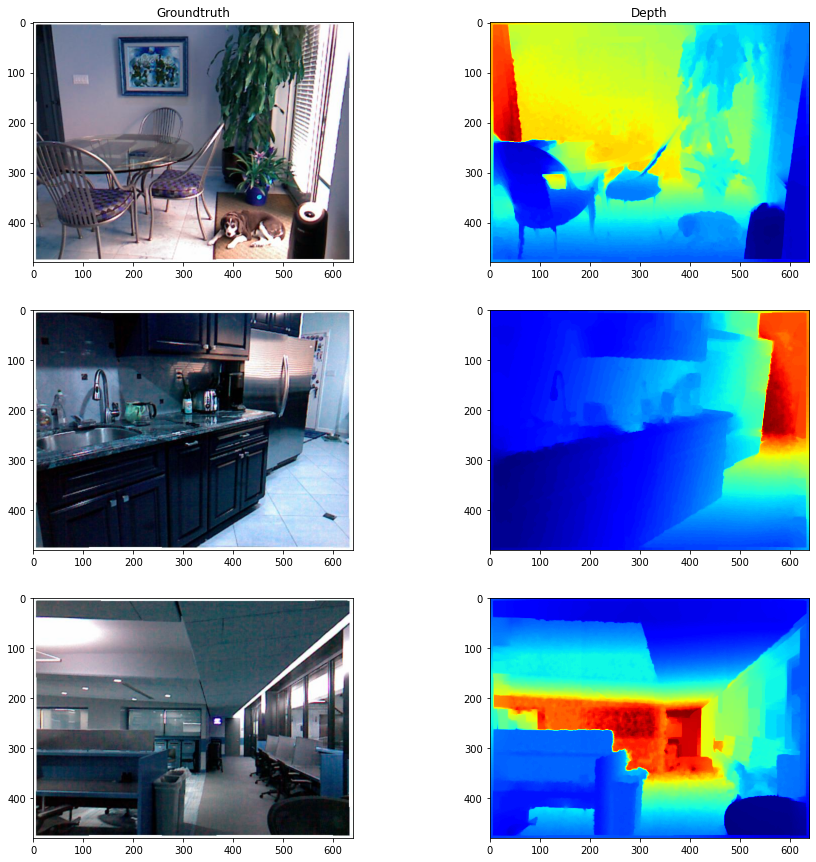

In [ ]:
fig, ax = plt.subplots(3, 2, figsize = (15, 15))
cmap = plt.cm.jet
cmap.set_bad(color="black")
for i in range(3):
      ax[i, 0].imshow(cv2.imread(training_data['image'][i]))
      ax[0, 0].set_title('RGB')
      ax[0, 1].set_title('Depth')
      ax[i, 1].imshow(cv2.imread(training_data['depth'][i],  cv2.IMREAD_GRAYSCALE), cmap = cmap)


##Building the dataset pipeline

In [ ]:
class DataGenerator(Dataset):
  def __init__(self, data):
    self.n_samples = data.shape[0]

  def __len__(self):
    ##Number of iteration for 1 epochs == number of samples / batch_size
    return self.n_samples
  
  def __getitem__(self, index):

    #Load and return image and corresponding depth 

    image_ = cv2.imread(data['image'][index])
    image_ = cv2.resize(image_, (int(Width/4), int(Height/4))) # The resize is necessary in order to not use all the colab's RAM
    image_ = cv2.cvtColor(image_, cv2.COLOR_BGR2RGB)
    image_ = transforms.ToTensor()(image_)
    image_ = torchvision.transforms.functional.convert_image_dtype(image_, torch.float32)
    

    depth_ = cv2.imread(data['depth'][index], cv2.IMREAD_GRAYSCALE)
    depth_ = cv2.resize(depth_, (int(Width/4), int(Height/4)))
    depth_ = transforms.ToTensor()(depth_)
    depth_ = torchvision.transforms.functional.convert_image_dtype(depth_, torch.float32)
    depth_ = 10*depth_ #we multiply each pixel for 10 because this is the max meters we can obtain with a monocular camera
    
    return image_, depth_

##Defining dataloader and dataset class

In [ ]:
batch_size = 32

In [ ]:
dataset_training = DataGenerator(training_data)
training_generator = DataLoader(dataset = dataset_training, batch_size = batch_size, shuffle = True, num_workers = 2)
examples_train = iter(training_generator)
image, depth= examples_train.next()

dataset_validation = DataGenerator(validation_data)
validation_generator = DataLoader(dataset = dataset_validation, batch_size = batch_size, shuffle = False, num_workers = 2)
examples_val = iter(validation_generator)
image, depth = examples_val.next()

##Unet complete

In [ ]:
class Block(nn.Module):
  ## The block concerns 2 convolution operations, the first that doubles the number of channels from input_channels to output_channels and the
  ##second one that goes from output_channels to output_channels. Both have a 3 x 3 kernel and no padding, followed by a ReLU activation function.
  ## The output of the block is an image( with the same size of the original image but double number of channel. 
  def __init__(self, input_channel, output_channel):
    super().__init__()


    self.block = nn.Sequential(
            nn.Conv2d(input_channel, output_channel, kernel_size = 3, padding = 'same', bias = True),
            nn.BatchNorm2d(output_channel),
            nn.LeakyReLU(0.2),
            nn.Conv2d(output_channel, output_channel, kernel_size = 3, padding = 'same', bias = True),
            nn.BatchNorm2d(output_channel),
            nn.LeakyReLU(0.2)        
    )

  def forward(self, x):
    return self.block(x)
## Now we are going to define the econder part that is the contractive part of the architecture

class Encoder(nn.Module):
  ## Here we add the max pooling operation that is performed between two block operations. 
  def __init__(self, channel = (3, 32, 64, 128, 256, 512)):
    super().__init__()
    self.encoding_blocks = nn.ModuleList([Block(channel[i], channel[i+1]) for i in range(len(channel) - 1)]) ##This is a list of block operation
    self.pool = nn.MaxPool2d(2)
  
  def forward(self, x): ## in this way we are going to reduce the size of the image but increasing the number of channels
    features = []
    for block in self.encoding_blocks:
      x = block(x)
      features.append(x)
      x = self.pool(x)
    
    return features


## Here we are going to define the decoder part that is the expansive part of the architecture.
class Decoder(nn.Module):
  def __init__(self, channel = (512, 256, 128, 64, 32)):
    super().__init__()
    self.channel = channel
    self.upconvolutions = nn.ModuleList([nn.ConvTranspose2d(channel[i], channel[i+1], 2, 2) for i in range(len(channel) - 1)])
    self.dec_blocks = nn.ModuleList([Block(channel[i], channel[i+1]) for i in range(len(channel) - 1)])
   
  def crop(self, encoder_features, x):
    _, _, H, W, = x.shape
    encoder_features = torchvision.transforms.CenterCrop([H, W])(encoder_features)
    return encoder_features

  def forward(self, x, enc__ftrs):
    for i in range(len(self.channel) - 1):
      x = self.upconvolutions[i](x)
    
      encoder_features = self.crop(enc__ftrs[i], x)
      x = torch.cat([x, encoder_features], dim = 1)
      x = self.dec_blocks[i](x)
      
    return x


## Now we are going to put all the encoder and decoder part together and form the U net
class UNet(nn.Module):
  def __init__(self, encoder_channel = (3, 32, 64, 128, 256, 512), decoder_channel = (512, 256, 128, 64, 32), num_class = 1, retain_dim = True, out_size = (Height/4, Width/4)):
    super().__init__()
    self.encoder = Encoder(encoder_channel)
    self.decoder = Decoder(decoder_channel)
    self.head = nn.Conv2d(decoder_channel[-1], num_class, 1)
    self.retain_dim = retain_dim

  def forward(self, x):
    encoder_features = self.encoder(x)
    out = self.decoder(encoder_features[::-1][0], encoder_features[::-1][1:])
    out = self.head(out)
    out_size = (int(Height/4), int(Width/4))
    if self.retain_dim:
      out = nn.functional.interpolate(out, out_size)
    return out
model1 = UNet()

In [ ]:
num = sum(p.numel() for p in (model1.parameters()))
print("Number of parameters: {}".format(num))

Number of parameters: 7765985


##Unet less parameters

In [ ]:
class Block(nn.Module):
  ## The block concerns 2 convolution operations, the first that doubles the number of channels from input_channels to output_channels and the
  ##second one that goes from output_channels to output_channels. Both have a 3 x 3 kernel and no padding, followed by a ReLU activation function.
  ## The output of the block is an image( with the same size of the original image but double number of channel. 
  def __init__(self, input_channel, output_channel):
    super().__init__()


    self.block = nn.Sequential(
            nn.Conv2d(input_channel, output_channel, kernel_size = 3, padding = 'same', bias = True),
            nn.BatchNorm2d(output_channel),
            nn.LeakyReLU(0.2),
            nn.Conv2d(output_channel, output_channel, kernel_size = 3, padding = 'same', bias = True),
            nn.BatchNorm2d(output_channel),
            nn.LeakyReLU(0.2)        
    )

  def forward(self, x):
    return self.block(x)
## Now we are going to define the econder part that is the contractive part of the architecture

class Encoder(nn.Module):
  ## Here we add the max pooling operation that is performed between two block operations. 
  def __init__(self, channel = (3, 24, 48, 96, 192, 384)):
    super().__init__()
    self.encoding_blocks = nn.ModuleList([Block(channel[i], channel[i+1]) for i in range(len(channel) - 1)]) ##This is a list of block operation
    self.pool = nn.MaxPool2d(2)
  
  def forward(self, x): ## in this way we are going to reduce the size of the image but increasing the number of channels
    features = []
    for block in self.encoding_blocks:
      x = block(x)
      features.append(x)
      x = self.pool(x)
    
    return features


## Here we are going to define the decoder part that is the expansive part of the architecture.
class Decoder(nn.Module):
  def __init__(self, channel = (384, 192, 96, 48, 24)):
    super().__init__()
    self.channel = channel
    self.upconvolutions = nn.ModuleList([nn.ConvTranspose2d(channel[i], channel[i+1], 2, 2) for i in range(len(channel) - 1)])
    self.dec_blocks = nn.ModuleList([Block(channel[i], channel[i+1]) for i in range(len(channel) - 1)])
   
  def crop(self, encoder_features, x):
    _, _, H, W, = x.shape
    encoder_features = torchvision.transforms.CenterCrop([H, W])(encoder_features)
    return encoder_features

  def forward(self, x, enc__ftrs):
    for i in range(len(self.channel) - 1):
      x = self.upconvolutions[i](x)
    
      encoder_features = self.crop(enc__ftrs[i], x)
      x = torch.cat([x, encoder_features], dim = 1)
      x = self.dec_blocks[i](x)
      
    return x


## Now we are going to put all the encoder and decoder part together and form the U net
class UNet2(nn.Module):
  def __init__(self, encoder_channel = (3, 24, 48, 96, 192, 384), decoder_channel = (384, 192, 96, 48, 24), num_class = 1, retain_dim = True, out_size = (Height/4, Width/4)):
    super().__init__()
    self.encoder = Encoder(encoder_channel)
    self.decoder = Decoder(decoder_channel)
    self.head = nn.Conv2d(decoder_channel[-1], num_class, 1)
    self.retain_dim = retain_dim

  def forward(self, x):
    encoder_features = self.encoder(x)
    out = self.decoder(encoder_features[::-1][0], encoder_features[::-1][1:])
    out = self.head(out)
    out_size = (int(Height/4), int(Width/4))
    if self.retain_dim:
      out = nn.functional.interpolate(out, out_size)
    return out
model2 = UNet2()

In [ ]:
num = sum(p.numel() for p in (model2.parameters()))
print("Number of parameters: {}".format(num))

Number of parameters: 4370281


##Resnet fine tuning

In [ ]:
channel_list3 =  [512, 256, 128, 64, 64]  #channels of the Decoder for the ResNet
Height = 480
Width = 640
feature_extract = True  #If false we're doing FineTuning, i.e. retraining the pretrained downloaded densenet

# True/False Weight updating
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = True



# Pretrained Resnet
def get_pretrained_resnet():
  resnet = torchvision.models.resnet34(pretrained = True)
  #resnet = torch.nn.Sequential(*(list(resnet.children())[:-1]))
  set_parameter_requires_grad(resnet, feature_extract)
  return resnet



class Block2(nn.Module):
  def __init__(self, in_channel, out_channel):
    super().__init__()

    self.block = nn.Sequential(
            nn.Conv2d(in_channel, out_channel, kernel_size = 3, padding = 'same'),
            nn.BatchNorm2d(out_channel),
            nn.ReLU(),
            nn.Conv2d(out_channel, out_channel, kernel_size = 3, padding = 'same'),
            nn.BatchNorm2d(out_channel),
            nn.ReLU()        
    )

  def forward(self, x):
    return self.block(x)
    


# Resnet Encoder
class Encoder2(nn.Module):
  def __init__(self):
    super().__init__()
    resnet = get_pretrained_resnet()
    #print(self.encoder._modules)
    self.resconv0 = resnet._modules['conv1']  #3,64 channels
    self.resbn0 = resnet._modules['bn1']
    self.resrelu0 = resnet._modules['relu']
    self.resmaxp0 = resnet._modules['maxpool']
    self.reslayer1 = resnet._modules['layer1'] #64,64 channels
    self.reslayer2 = resnet._modules['layer2'] #64,128 channels
    self.reslayer3 = resnet._modules['layer3'] #128,256 channels
    self.reslayer4 = resnet._modules['layer4'] #256,512 channels



  def forward(self, x):
    features = []   #outputs features maps storined in a vector

    x = self.resconv0(x)
    x = self.resbn0(x)
    x = self.resrelu0(x)
    x = self.resmaxp0(x)
    features.append(x)

    x = self.reslayer1(x)
    features.append(x)

    x = self.reslayer2(x)
    features.append(x)

    x = self.reslayer3(x)
    features.append(x)

    out = self.reslayer4(x)
    features.append(out)

    return features



class Bottleneck2(nn.Module):
  def __init__(self):
    super().__init__()
    self.convA = nn.Conv2d(in_channels = 512,
                           out_channels = 512,
                           kernel_size = (1,1),
                           padding = 'same',
                           stride = 1)
    self.reluA = nn.ReLU()
    

  def forward(self, x):
    x = self.convA(x)
    out = self.reluA(x)
    return out



class Decoder2(nn.Module):
  def __init__(self, channel = channel_list3):
    super().__init__()
    self.channel = channel

    self.upconvolutions1 = nn.ConvTranspose2d(in_channels = channel[0],
                                              out_channels = channel[1], 
                                              kernel_size  = 2, 
                                              stride = 2,
                                              padding = (0,0))
    
    self.block1 = Block2(channel[0], channel[1])


    self.upconvolutions2 = nn.ConvTranspose2d(in_channels = channel[1],
                                              out_channels = channel[2], 
                                              kernel_size  = 2, 
                                              stride = 2,
                                              padding = (0,0))
    
    self.block2 = Block2(channel[1],channel[2])


    self.upconvolutions3 = nn.ConvTranspose2d(in_channels = channel[2],
                                              out_channels = channel[3], 
                                              kernel_size  = 2, 
                                              stride = 3,
                                              padding = (2,2))
    
    self.block3 = Block2(channel[2], channel[3])


    self.upconvolutions4 = nn.ConvTranspose2d(in_channels = channel[3],
                                              out_channels = channel[4], 
                                              kernel_size  = 2, 
                                              stride = 3,
                                              padding = (2,2))
    
    self.block4 = Block2(channel[2], channel[4])

    #self.upconvolutions5 = nn.ConvTranspose2d(in_channels = channel[4],
                                              #out_channels = channel[5], 
                                              #kernel_size  = 2, 
                                              #stride = 3,
                                              #padding = (1,1))
    
    #self.block5 = Block2([3], channel[5])

  


  def crop(self, encoder_features, x):
    _, _, H, W, = x.shape
    encoder_features = torchvision.transforms.CenterCrop([H, W])(encoder_features)
    return encoder_features

   
  def forward(self, x, enc_ftrs):
    x = self.upconvolutions1(x)
    skip_conn = self.crop(enc_ftrs[0], x)
    x = torch.cat([x, skip_conn], dim = 1)
    x = self.block1(x)

    x = self.upconvolutions2(x)
    skip_conn = self.crop(enc_ftrs[1], x)
    x = torch.cat([x, skip_conn], dim = 1)
    x = self.block2(x)

    x = self.upconvolutions3(x)
    skip_conn = self.crop(enc_ftrs[2], x)
    x = torch.cat([x, skip_conn], dim = 1)
    x = self.block3(x)

    x = self.upconvolutions4(x)
    skip_conn = self.crop(enc_ftrs[3], x)
    x = torch.cat([x, skip_conn], dim = 1)
    out = self.block4(x)

    #x = self.upconvolutions5(x)
    #print("upconv5 shape: ", x.shape)
    #encoder_features = self.crop(enc_ftrs[4], x)
    #x = torch.cat([x, encoder_features], dim = 1)
    #print("upconv4 + concat: ", x.shape)
    #out = self.block5(x)

    return out


class Model3(nn.Module):
  def __init__(self, channel = channel_list3, retain_dim = True):
    super().__init__()

    self.encoder = Encoder2()
    self.bottle_neck = Bottleneck2()
    self.decoder = Decoder2(channel)
    self.head = nn.Conv2d(64, 1, 1)

    self.retain_dim = retain_dim 

  def forward(self, x):
    encoder_features = self.encoder(x)
    x = self.bottle_neck(encoder_features[-1])
    x = self.decoder(x, encoder_features[::-1][1:])
    out = self.head(x)
    out_size = (int(Height/4), int(Width/4))
    if self.retain_dim:
      out = nn.functional.interpolate(out, out_size)
    return out

model3 = Model3()

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

In [ ]:
num = sum(p.numel() for p in (model3.parameters()))
print("Number of parameters: {}".format(num))

Number of parameters: 24688513


##Unet + resnet

In [ ]:
channel_list3 =  [512, 256, 128, 64, 64]  #channels of the Decoder for the ResNet
Height = 480
Width = 640
feature_extract = True  #If false we're doing FineTuning, i.e. retraining the pretrained downloaded densenet

# True/False Weight updating
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = True



# Pretrained Resnet
def get_pretrained_resnet():
  resnet = torchvision.models.resnet34(pretrained = True)
  #resnet = torch.nn.Sequential(*(list(resnet.children())[:-1]))
  set_parameter_requires_grad(resnet, feature_extract)
  return resnet



class Block3(nn.Module):
  def __init__(self, in_channel, out_channel):
    super().__init__()

    self.block = nn.Sequential(
            nn.Conv2d(in_channel, out_channel, kernel_size = 3, padding = 'same'),
            nn.BatchNorm2d(out_channel),
            nn.ReLU(),
            nn.Conv2d(out_channel, out_channel, kernel_size = 3, padding = 'same'),
            nn.BatchNorm2d(out_channel),
            nn.ReLU()        
    )

  def forward(self, x):
    return self.block(x)
    

class ResBlock(nn.Module):
  def __init__(self, in_channels, out_channels):
    super().__init__()

    self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=2, padding=1)
    self.bn1 = nn.BatchNorm2d(out_channels)

    self.shortcut = nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=2),
        nn.BatchNorm2d(out_channels)
    )

    self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1)
    self.bn2 = nn.BatchNorm2d(out_channels)


  def forward(self, x):
    residual = self.shortcut(x)
    x = nn.ReLU()(self.bn1(self.conv1(x)))
    x = nn.ReLU()(self.bn2(self.conv2(x)))
    output = nn.ReLU()(x + residual)
    #print("output ResBlock connect shape: ", output.shape)
    return output



# Resnet Encoder
class Encoder3(nn.Module):
  def __init__(self):
    super().__init__()
    resnet = get_pretrained_resnet()
    #print(self.encoder._modules)
    self.resconv0 = resnet._modules['conv1']  #3,64 channels
    self.resbn0 = resnet._modules['bn1']
    self.resrelu0 = resnet._modules['relu']
    self.resmaxp0 = resnet._modules['maxpool']
    self.reslayer1 = resnet._modules['layer1'] #64,64 channels
    self.reslayer2 = resnet._modules['layer2'] #64,128 channels
    self.reslayer3 = resnet._modules['layer3'] #128,256 channels
    self.reslayer4 = resnet._modules['layer4'] #256,512 channels



  def forward(self, x):
    features = []   #outputs features maps storined in a vector

    x = self.resconv0(x)
    x = self.resbn0(x)
    x = self.resrelu0(x)
    x = self.resmaxp0(x)
    features.append(x)

    x = self.reslayer1(x)
    features.append(x)

    x = self.reslayer2(x)
    features.append(x)

    x = self.reslayer3(x)
    features.append(x)

    out = self.reslayer4(x)
    features.append(out)

    return features



class Bottleneck3(nn.Module):
  def __init__(self):
    super().__init__()
    self.convA = nn.Conv2d(in_channels = 512,
                           out_channels = 512,
                           kernel_size = (1,1),
                           padding = 'same',
                           stride = 1)
    self.reluA = nn.ReLU()
    

  def forward(self, x):
    x = self.convA(x)
    out = self.reluA(x)
    return out



class Decoder3(nn.Module):
  def __init__(self, channel = channel_list3):
    super().__init__()
    self.channel = channel

    self.upconvolutions1 = nn.ConvTranspose2d(in_channels = channel[0],
                                              out_channels = channel[1], 
                                              kernel_size  = 2, 
                                              stride = 2,
                                              padding = (0,0))
    
    self.concat1 = ResBlock(channel[1], channel[1])
    self.block1 = Block3(channel[0], channel[1])


    self.upconvolutions2 = nn.ConvTranspose2d(in_channels = channel[1],
                                              out_channels = channel[2], 
                                              kernel_size  = 2, 
                                              stride = 2,
                                              padding = (0,0))
    
    self.concat2 = ResBlock(channel[2], channel[2])
    self.block2 = Block3(channel[1],channel[2])


    self.upconvolutions3 = nn.ConvTranspose2d(in_channels = channel[2],
                                              out_channels = channel[3], 
                                              kernel_size  = 2, 
                                              stride = 3,
                                              padding = (2,2))
    
    self.concat3 = ResBlock(channel[3], channel[3])
    self.block3 = Block3(channel[2], channel[3])


    self.upconvolutions4 = nn.ConvTranspose2d(in_channels = channel[3],
                                              out_channels = channel[4], 
                                              kernel_size  = 2, 
                                              stride = 3,
                                              padding = (2,2))
    
    self.concat4 = ResBlock(channel[4], channel[4])
    self.block4 = Block3(channel[2], channel[4])

    #self.upconvolutions5 = nn.ConvTranspose2d(in_channels = channel[4],
                                              #out_channels = channel[5], 
                                              #kernel_size  = 2, 
                                              #stride = 3,
                                              #padding = (1,1))
    
    #self.block5 = Block3([3], channel[5])

  


  def crop(self, encoder_features, x):
    _, _, H, W, = x.shape
    encoder_features = torchvision.transforms.CenterCrop([H, W])(encoder_features)
    return encoder_features

   
  def forward(self, x, enc_ftrs):
    x = self.upconvolutions1(x)
    #print("upconv1 shape: ", x.shape)
    #print("\nenc_ftrs [0] shape: ", enc_ftrs[0].shape)
    res_concat = self.concat1(enc_ftrs[0])
    #print("res_concat1 shape: ", res_concat.shape)
    skip_conn = self.crop(res_concat, x)
    #print("concat1 post crop shape: ", skip_conn.shape)
    x = torch.cat([x, skip_conn], dim = 1)
    #print("upconv1 + concat: ", x.shape)
    x = self.block1(x)

    x = self.upconvolutions2(x)
    #print("\nenc_ftrs [1] shape: ", enc_ftrs[1].shape)
    res_concat = self.concat2(enc_ftrs[1])
    #print("res_concat2 shape: ", res_concat.shape)
    skip_conn = self.crop(res_concat, x)
    x = torch.cat([x, skip_conn], dim = 1)
    x = self.block2(x)

    x = self.upconvolutions3(x)
    #print("\nenc_ftrs [2] shape: ", enc_ftrs[2].shape)
    res_concat = self.concat3(enc_ftrs[2])
    #print("res_concat3 shape: ", res_concat.shape)
    skip_conn = self.crop(res_concat, x)
    x = torch.cat([x, skip_conn], dim = 1)
    x = self.block3(x)

    x = self.upconvolutions4(x)
    #print("\nenc_ftrs [3] shape: ", enc_ftrs[3].shape)
    res_concat = self.concat4(enc_ftrs[3])
    #print("res_concat4 shape: ", res_concat.shape)
    skip_conn = self.crop(res_concat, x)
    #print("concat4 post crop shape: ", skip_conn.shape)
    x = torch.cat([x, skip_conn], dim = 1)
    #print("upconv4 + concat: ", x.shape)
    out = self.block4(x)

    #x = self.upconvolutions5(x)
    #print("upconv5 shape: ", x.shape)
    #encoder_features = self.crop(enc_ftrs[4], x)
    #x = torch.cat([x, encoder_features], dim = 1)
    #out = self.block5(x)

    return out


class Model4(nn.Module):
  def __init__(self, channel = channel_list3, retain_dim = True):
    super().__init__()

    self.encoder = Encoder3()
    self.bottle_neck = Bottleneck3()
    self.decoder = Decoder3(channel)
    self.head = nn.Conv2d(64, 1, 1)

    self.retain_dim = retain_dim 

  def forward(self, x):
    encoder_features = self.encoder(x)
    x = self.bottle_neck(encoder_features[-1])
    x = self.decoder(x, encoder_features[::-1][1:])
    out = self.head(x)
    out_size = (int(Height/4), int(Width/4))
    if self.retain_dim:
      out = nn.functional.interpolate(out, out_size)
    return out

model4 = Model4()

In [ ]:
num = sum(p.numel() for p in (model4.parameters()))
print("Number of parameters: {}".format(num))

Number of parameters: 26405249


##Setting Hyperparameters

In [ ]:
Epochs = 25
learning_rate = 0.001

# Non so se ha senso definire l'optimizer già qua. Mentre scheduler dovrebbe servire a ridurre progressivamente il learning rate durante il processo
# di training alle descritte milestones (che si riferiscono alle epoche), però è una cosa in più secondo me quando si lavora con tante epoche 
#opt = torch.optim.Adam(model.parameters(), lr= Lr) 
#scheduler = torch.optim.lr_scheduler.MultiStepLR(opt, milestones=[10,15,20,24,27,29,30], gamma=0.75)


##Loss function and optimizer

In [ ]:
def calculate_loss(prediction, true):

  #Sobel edge detector loss 
  w1 = 1

  x_filter = np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]], dtype = np.float32)# x Sobel filter
  y_filter = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], dtype = np.float32)# y Sobel filter
  x_filter = torch.from_numpy(x_filter).float().reshape((1, 1, 3, 3))
  x_filter = x_filter.to(device)
  y_filter = torch.from_numpy(y_filter).float().reshape((1, 1, 3, 3))
  y_filter = y_filter.to(device)

  gx_p = F.conv2d(prediction, x_filter, bias = None, padding = 'same')
  gy_p = F.conv2d(prediction, y_filter, bias = None, padding = 'same')
  gx_t = F.conv2d(true, x_filter, bias = None, padding = 'same')
  gy_t = F.conv2d(true, y_filter, bias = None, padding = 'same')

  #weights_x = torch.exp(torch.mean(torch.abs(gx_t)))
  #weights_y = torch.exp(torch.mean(torch.abs(gy_t)))
  #smoothness_x = gx_p * weights_x
  #smoothness_y = gy_p * weights_y
  #depth_smoothness_loss = torch.mean(torch.abs(smoothness_x) + torch.abs(smoothness_y))
  
  sobel_loss = torch.mean(torch.abs(gx_p - gx_t) + torch.abs(gy_p - gy_t))

  #Structural similarity (SSIM) index
  w2 = 1
  ssim_loss = (1 - ssim(true, prediction, data_range = 10, win_size = 7, K = [0.01**2, 0.03**2])) / 2


  # Mean absolute error loss
  w3 = 0.1
  mae = torch.mean(torch.abs(true - prediction))

  #Total loss

  loss = (w1 * sobel_loss + w2 * ssim_loss + w3 * mae)

  return loss

In [ ]:
def sobel_loss1(prediction ,true):
  x_filter = np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]], dtype = np.float32)# x Sobel filter
  y_filter = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], dtype = np.float32)# y Sobel filter
  x_filter = torch.from_numpy(x_filter).float().reshape((1, 1, 3, 3))
  x_filter = x_filter.to(device)
  y_filter = torch.from_numpy(y_filter).float().reshape((1, 1, 3, 3))
  y_filter = y_filter.to(device)

  gx_p = F.conv2d(prediction, x_filter, bias = None, padding = 'same')
  gy_p = F.conv2d(prediction, y_filter, bias = None, padding = 'same')
  gx_t = F.conv2d(true, x_filter, bias = None, padding = 'same')
  gy_t = F.conv2d(true, y_filter, bias = None, padding = 'same')

  #weights_x = torch.exp(torch.mean(torch.abs(gx_t)))
  #weights_y = torch.exp(torch.mean(torch.abs(gy_t)))
  #smoothness_x = gx_p * weights_x
  #smoothness_y = gy_p * weights_y
  #depth_smoothness_loss = torch.mean(torch.abs(smoothness_x) + torch.abs(smoothness_y))
  
  return torch.mean(torch.abs(gx_p - gx_t) + torch.abs(gy_p - gy_t))


In [ ]:
# loss_function = lambda prediction, true : calculate_loss(prediction, true)
mse = nn.MSELoss()
loss_function = lambda predicted, true: calculate_loss(predicted, true)

mae = lambda predicted, true: torch.mean(torch.abs(true - predicted))
rmse = lambda predicted, true: torch.sqrt(mse(predicted, true))
sobel_loss = lambda predicted, true: sobel_loss1(predicted, true)

ssim_loss = lambda true, prediction: (1 - ssim(true, prediction, data_range = 10, win_size = 7, K = [0.01**2, 0.03**2])) / 2
optimizer = torch.optim.Adam(model3.parameters(), lr = learning_rate)

#optimizer = torch.optim.SGD(model3.parameters(), lr=learning_rate, momentum = 0.9, weight_decay = 1e-5)

##Accuracy

In [ ]:
def accuracy_delta(predicted,true,threshold, pow):
  maxRatio = torch.max(predicted / true, true / predicted)
  delta1 = float((maxRatio < threshold**pow).float().mean())
  return delta1

##Set up tensorboard

In [ ]:
%load_ext tensorboard
from torch.utils.tensorboard import SummaryWriter
file_writer = SummaryWriter()
import datetime
from timeit import Timer as timer
!rm -rf ./logs/

##Set up GPU instead of CPU

In [ ]:
# declare a variable which will hold the device we’re training on (CPU or GPU)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

if torch.cuda.is_available: #we load the model on the device
  model = model3.to(device)
!nvidia-smi -L

GPU 0: Tesla P100-PCIE-16GB (UUID: GPU-e2496109-7310-acaa-695f-4b7eb61b2a72)


##Training of the model

In [ ]:
#To import the progression bar, if we use it, now not because the bar is incomplete for the data we desire
from tqdm.notebook import tqdm

In [ ]:
total_training_time = 0.0
training_start_time = time.time()

for epoch in range(1, Epochs + 1):
  epoch_start_time = time.time()
  #progress_bar = tqdm()

  #reset metrics
  train_loss = 0.0
  val_loss = 0.0
  train_correct = 0.0
  val_correct = 0.0
  epoch_dur = 0.0
  train_loss_mae = 0.0
  train_loss_gradient = 0.0 
  train_loss_similarity = 0.0

  ##Training loop
  model.train()
  for step, (input_train, true_train) in enumerate(training_generator):

    #Use GPU if available
    input_train = input_train.to(device) #putting the data on the gpu
    true_train = true_train.to(device)

    #Training steps 
    prediction_training = model(input_train) #forward pass: predict output for each image
    loss = loss_function(prediction_training, true_train) #calculate loss
    loss_mae = mae(true_train, prediction_training)
    loss_gradient = sobel_loss1(true_train, prediction_training)
    loss_similarity = ssim_loss(true_train, prediction_training)   
    optimizer.zero_grad() #clear the value of the gradients
    loss.backward() #backward pass: compute the gradient of the loss w.r.t. the model parameters
    optimizer.step() #update parameters
    train_loss += loss.item() * input_train.size(0) #uptade training loss
    train_correct += accuracy_delta(prediction_training, true_train, 1.25, 1)* input_train.size(0) #update training accuracy
    train_loss_mae += loss_mae.item() * input_train.size(0)
    train_loss_gradient += loss_gradient.item() * input_train.size(0)
    train_loss_similarity += loss_similarity.item() * input_train.size(0)
    #del input
    #gc.collect()

  ## Validation loop
  model.eval()    
  for step, (input_validation, true_validation) in enumerate(validation_generator):
    # use GPU if available
    input_validation = input_validation.to(device)
    true_validation = true_validation.to(device)

    #Validation steps
    with torch.no_grad(): # we are not going to calculate the gradient at every step
      prediction_validation = model(input_validation) #this is the forward pass: predict outputs for each image
      loss = loss_function(prediction_validation, true_validation) # here we are calculating the loss
      val_loss += loss.item() * input_validation.size(0) #we are udpating validation loss
      val_correct += accuracy_delta(prediction_validation, true_validation, 1.25, 1) * input_validation.size(0)# uptdating validation accuracy
  
  # Calculate the average losses and accuracy 
  train_loss = train_loss / len(training_generator.sampler)
  val_loss = val_loss / len(validation_generator.sampler)
  train_acc = train_correct / len(training_generator.sampler)
  val_acc = val_correct / len(validation_generator.sampler)
  train_loss_mae = train_loss_mae / len(training_generator.sampler)
  train_loss_gradient = train_loss_gradient / len(training_generator.sampler)
  train_loss_similarity = train_loss_similarity / len(training_generator.sampler)


  #end_time = timer() #get time taken for epoch
  epoch_dur = round(time.time() - epoch_start_time, 2)

  #We display metrics at the end of each epoch
  print(f'Epoch: {epoch} / {Epochs} \tTraining Loss: {train_loss} \tValidation Loss: {val_loss} \n \
           \tTraining Accuracy: {train_acc} \tValidation Accuracy: {val_acc} \tEpoch Time: {epoch_dur}s \n \
           \tMAE Loss: {train_loss_mae} \tSobel Loss: {train_loss_gradient} \tSSIM Loss:{train_loss_similarity} ')
  # Log metrics to tensorboard
  file_writer.add_scalar('Training loss', train_loss, epoch)
  file_writer.add_scalar('Validation loss', val_loss, epoch)
  file_writer.add_scalar('Training accuracy', train_acc, epoch)
  file_writer.add_scalar('Validation accuracy ', val_acc, epoch)
  file_writer.add_scalar('epoch_time', epoch_dur, epoch)
  file_writer.add_scalar('Mae_loss', train_loss_mae, epoch)
  file_writer.add_scalar('Sobel_loss', train_loss_gradient, epoch)
  file_writer.add_scalar('SSim_loss', train_loss_similarity, epoch)

  #progress_bar.update()
  #progress_bar.set_postfix(epoch=epoch, loss=train_loss, )  #non è da inserire loss.item ma train_loss o val_loss

#progress_bar.close()

total_training_time = round((time.time() - training_start_time)/60, 2)  #get the total time of training
print(f'\nThe amount of time for the training process is: {total_training_time}mins')  

state_dict = model.state_dict()
torch.save(state_dict, '/content/Model3')
file_writer.flush()
file_writer.close()

Epoch: 1 / 25 	Training Loss: 1.2963132509320938 	Validation Loss: 0.9125618493681618 
            	Training Accuracy: 0.2729860833592643 	Validation Accuracy: 0.38909106890779904 	Epoch Time: 248.19s 
            	MAE Loss: 1.332122491696613 	Sobel Loss: 0.7305321075413583 	SSIM Loss:0.432568894348368 
Epoch: 2 / 25 	Training Loss: 1.198686118860868 	Validation Loss: 0.8898123455343926 
            	Training Accuracy: 0.3530828991932875 	Validation Accuracy: 0.3990708524330019 	Epoch Time: 227.47s 
            	MAE Loss: 1.085349069159069 	Sobel Loss: 0.6845296649574204 	SSIM Loss:0.40562154979211923 
Epoch: 3 / 25 	Training Loss: 1.164392033705141 	Validation Loss: 0.8262926966604525 
            	Training Accuracy: 0.37018214673649075 	Validation Accuracy: 0.44664412320709646 	Epoch Time: 224.53s 
            	MAE Loss: 1.0448308124759782 	Sobel Loss: 0.6763434664447563 	SSIM Loss:0.3835654875676523 
Epoch: 4 / 25 	Training Loss: 1.0758402658861164 	Validation Loss: 0.74227352358928

##Plot train and test accuracy

In [ ]:
%tensorboard --logdir '/content/runs' --load_fast true

<IPython.core.display.Javascript object>

##Preparing the test set

In [ ]:
path1 = '/content/Dataset/data/nyu2_test'
path2 = '/content/Testset/'

test_file = []
for root, dirs, files in os.walk(path1):
  for file in files:
    test_file.append(os.path.join(root, file))
test_file.sort()

test = {
    "image": [test_file[i] for i in range(len(test_file)) if i % 2 == 0],
    "depth": [test_file[i] for i in range(len(test_file)) if i % 2 != 0],
}

test_set = pd.DataFrame(test)
test_set = test_set.sample(frac = 1, random_state = 5).reset_index(drop = True)
print(f"Number of test examples: {test_set.shape[0]}")

test_generator = DataGenerator(test_set)
test_generator= DataLoader(dataset = test_generator, batch_size = 1, shuffle = True, num_workers = 2)
examples_test = iter(test_generator)
image, depth= examples_test.next()

Number of test examples: 654


##Load the trained model

In [ ]:
model_test = UNet()
model_test.load_state_dict(torch.load('/content/drive/MyDrive/Colab Notebooks/Model_rmse'))
model_test.eval()

# declare a variable which will hold the device we’re training on (CPU or GPU)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

if torch.cuda.is_available: #we load the model on the device
  model_test = model_test.to(device)
num = sum(p.numel() for p in (model_test).parameters())
print("Number of parameters: {}".format(num))

Number of parameters: 7765985


##Evaluate the model

In [ ]:
test_loss = 0
test_accuracy1 = 0
test_accuracy2 = 0
test_accuracy3 = 0

for step, (images, depth) in enumerate(test_generator):
                            
  with torch.no_grad(): 
    inputs = images.to(device) #Using GPU if available
    depths = depth.to(device)
    outputs = model_test(inputs)
    loss = rmse(outputs, depths)
    test_loss += loss.item()
    test_accuracy1 += accuracy_delta(outputs, depths, 1.25, 1)
    test_accuracy2 += accuracy_delta(outputs, depths, 1.25, 2)
    test_accuracy3 += accuracy_delta(outputs, depths, 1.25, 3)
        
test_loss = test_loss / len(test_generator.sampler)
test_accuracy1 = test_accuracy1 / len(test_generator.sampler)
test_accuracy2 = test_accuracy2 / len(test_generator.sampler)
test_accuracy3 = test_accuracy3 / len(test_generator.sampler)
print(f'Total test loss is {test_loss} and the total accuracy1 is {test_accuracy1} \n \
\t the total accuracy2 is {test_accuracy2} the total accuracy3 is {test_accuracy3}')

Total test loss is 0.18832377666772687 and the total accuracy1 is 0.9751213924782721 
 	 the total accuracy2 is 0.9969980567238017 the total accuracy3 is 0.9994611796618237


In [ ]:
%tensorboard --logdir '/content/runs' --load_fast true

##Plot reconstructed images of our autoencoder

In [ ]:
def image_from_pytorch_tensor_to_numpy_array(image_to_be_converted):
  final_image = image_to_be_converted[0].squeeze()
  final_image = final_image.transpose(0, 2).transpose(0, 1)
  final_image = final_image.cpu().numpy()
  return final_image
def depth_from_pytorch_tensor_to_numpy_array(depth_to_be_converted):
  final_depth = depth_to_be_converted[0].squeeze()
  final_depth = final_depth.cpu().numpy()
  return final_depth


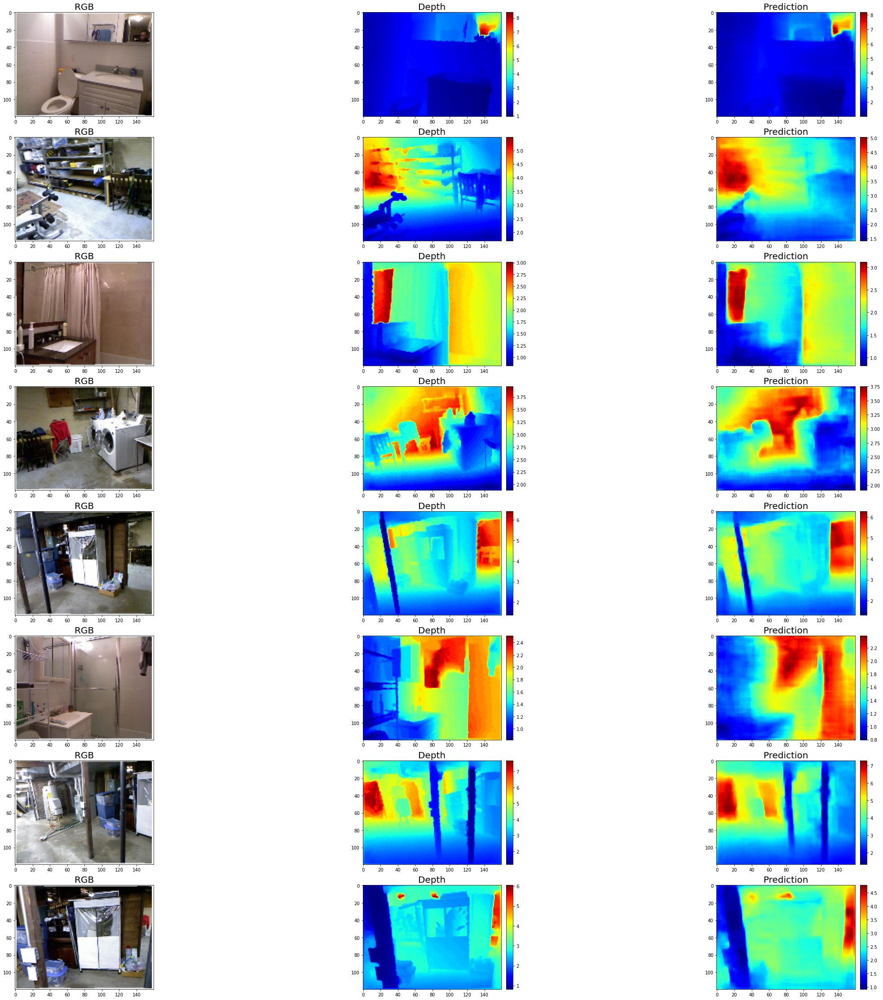

In [ ]:
fig, ax = plt.subplots(8, 3, figsize = (40, 40))
cmap = plt.cm.jet
cmap.set_bad(color="black")
from mpl_toolkits.axes_grid1 import make_axes_locatable

for i, (image, depth) in enumerate(test_generator):
  if (i < 8):
    image = image.to(device)
    depth = depth.to(device)
    output = model_test(image)
    image = image_from_pytorch_tensor_to_numpy_array(image)
    depth = depth_from_pytorch_tensor_to_numpy_array(depth)
    output = output.detach()
    output = depth_from_pytorch_tensor_to_numpy_array(output)
    ax[i, 0].set_title('RGB', fontsize = 20)
    ax[i, 1].set_title('Depth', fontsize = 20)
    ax[i, 2].set_title('Prediction', fontsize = 20)
    inp = ax[i, 0].imshow(image)
    dep = ax[i, 1].imshow(depth, cmap = cmap)
    out = ax[i, 2].imshow(output, cmap = cmap)


    divider2 = make_axes_locatable(ax[i,1])
    cax2 = divider2.append_axes("right", size="5%", pad=0.15)
    divider3 = make_axes_locatable(ax[i,2])
    cax3 = divider3.append_axes("right", size="5%", pad=0.15)
    fig.colorbar(dep, cax=cax2, orientation='vertical')
    fig.colorbar(out, cax=cax3, orientation='vertical')
    
  else:
    break